# Hyperspectral data augmentation with `cuvis-ai-augment`

This notebook is the end-to-end tutorial for the eight transforms across four families (spatial, spectral, photometric, mixing) shipped in [`cuvis-ai-augment`](https://github.com/cubert-hyperspectral/cuvis-ai-augment): `RandomHorizontalFlip`, `RandomVerticalFlip`, `Random90Rotate`, and `RandomSpatialCrop`, wrapped in a single `AugmentationCompose` Node.

We use a real lentils hyperspectral cube from the public Cubert dataset on HuggingFace and walk through each transform with **three-band visualisations** showing the same frame at low / mid / high band indices, before vs after augmentation. The point of the three-band view is to **prove the transforms are channel-agnostic**: the same geometric operation has to land the same way in every band, otherwise something is wrong with the implementation.

By the end you'll know:

- How to wire `AugmentationCompose` into a cuvis.ai pipeline YAML.
- What each transform does to a cube + its paired mask.
- Why these augmentations only fire at training time (`execution_stages={TRAIN}`).

## Prerequisites

> - Python 3.11+
> - `cuvis-ai-augment` installed (the Colab cell below does this if needed).
> - Internet access on first run to download the lentils cube from HuggingFace (`huggingface_hub` handles caching to `~/.cache/huggingface/`).
> - No HuggingFace login required — the dataset is public.

## 1 · Setup

In [1]:
# Colab bootstrap — installs the plugin and notebook extras. No-op outside Colab.
import sys

IN_COLAB = "google.colab" in sys.modules
if IN_COLAB:
    %pip install -q "cuvis-ai-augment[notebooks]" huggingface_hub matplotlib

In [2]:
from pathlib import Path

import matplotlib.pyplot as plt
import numpy as np
import torch

from cuvis_ai_augment.node.compose import AugmentationCompose

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"torch={torch.__version__}, device={device}")
print(f"AugmentationCompose.available_transforms() = {AugmentationCompose.available_transforms()}")

torch=2.11.0+cpu, device=cpu
AugmentationCompose.available_transforms() = ['Cutout', 'GaussianBandNoise', 'MultiplicativeIlluminationScaling', 'Random90Rotate', 'RandomBandDropout', 'RandomHorizontalFlip', 'RandomSpatialCrop', 'RandomVerticalFlip']


## 2 · Load the lentils cube

Tries three sources in order so the notebook runs anywhere:

1. **HuggingFace** — pulls `Auto_003+01.cu3s` from [cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils](https://huggingface.co/datasets/cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils). Requires `huggingface_hub` and the `cuvis` SDK to parse the `.cu3s`.
2. **Local `.cu3s`** — a few candidate paths that match my dev machines.
3. **Synthetic** — a small random cube with a bright diagonal stripe so geometric ops are visible even when no real data is around.

All three normalise to a `(1, H, W, C) float32` cube in `[0, 1]`, then crop to a centred square (so `Random90Rotate`'s odd-k path works without the H==W ValueError).

We pair the cube with a **synthetic disc mask** placed off-centre in the upper-left quadrant. Asymmetric placement matters — every transform should visibly move it, and the mask labels must track the cube pixels exactly.

In [3]:
LENTILS_DEMO_REPO = "cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils"
LENTILS_CU3S_FILE = "measurements/cu3s/2026_04_15_13_32_55/Auto_003+01.cu3s"

LOCAL_CANDIDATES = [
    Path("C:/Users/anish.raj/projects/gitlab_cuvis_ai_3/cuvis.ai/data/Lentils/Lentils_000.cu3s"),
    Path(
        "C:/Users/anish.raj/projects/gitlab_cuvis_ai_3/cuvis-ai-adaclip-latest/data/Lentils/Lentils_000.cu3s"
    ),
    Path("data/Lentils/Lentils_000.cu3s"),
]


def _open_cu3s_to_cube(cu3s_path: Path) -> torch.Tensor:
    """Open a .cu3s, return a (1, H, W, C) float32 cube cropped to a centred square
    and downsampled so matplotlib stays snappy."""
    import cuvis  # type: ignore[import-not-found]

    sess = cuvis.SessionFile(str(cu3s_path))
    mesu = sess.get_measurement(0)
    mesu.refresh()
    arr = mesu.cube.array.astype(np.float32)
    arr = arr / max(float(arr.max()), 1.0)
    H, W = arr.shape[:2]
    side = min(H, W)
    top, left = (H - side) // 2, (W - side) // 2
    arr = arr[top : top + side, left : left + side, :]
    stride = max(side // 256, 1)
    arr = arr[::stride, ::stride, :]
    return torch.from_numpy(arr).unsqueeze(0)


def load_lentils_cube() -> tuple[torch.Tensor, str]:
    """Return (cube, source_label). Tries HF → local paths → synthetic stripe."""
    # 1. HuggingFace.
    try:
        from huggingface_hub import hf_hub_download  # type: ignore[import-not-found]

        cu3s_path = Path(
            hf_hub_download(
                repo_id=LENTILS_DEMO_REPO,
                filename=LENTILS_CU3S_FILE,
                repo_type="dataset",
            )
        )
        cube = _open_cu3s_to_cube(cu3s_path)
        return cube, f"HuggingFace {LENTILS_DEMO_REPO}: {cu3s_path.name}"
    except Exception as exc:  # pragma: no cover - notebook-side fallback
        print(f"HF path skipped: {type(exc).__name__}: {exc}")

    # 2. Local candidates.
    try:
        for path in LOCAL_CANDIDATES:
            if path.exists():
                cube = _open_cu3s_to_cube(path)
                return cube, f"Local: {path.name}"
    except Exception as exc:
        print(f"Local path skipped: {type(exc).__name__}: {exc}")

    # 3. Synthetic fallback.
    torch.manual_seed(0)
    H = W = 128
    C = 32
    cube = torch.rand((1, H, W, C), dtype=torch.float32)
    for i in range(min(H, W)):
        cube[0, i, i, :] = 1.0  # bright diagonal so geometry is visible.
    return cube, "Synthetic stripe (no HF / no local .cu3s)"


cube, source_label = load_lentils_cube()
B, H, W, C = cube.shape
print(f"Loaded cube from: {source_label}")
print(f"cube shape = {tuple(cube.shape)}, dtype = {cube.dtype}")

# Build a synthetic disc mask (off-centre, asymmetric) so we can see it move.
yy, xx = torch.meshgrid(torch.arange(H), torch.arange(W), indexing="ij")
cy, cx = H // 3, W // 3
r = min(H, W) // 8
mask = (((yy - cy) ** 2 + (xx - cx) ** 2) <= r**2).to(torch.int32).unsqueeze(0)
print(
    f"mask shape = {tuple(mask.shape)}, dtype = {mask.dtype}, positive pixels = {int(mask.sum())}"
)

Loaded cube from: HuggingFace cubert-gmbh/XMR_Demo_Industrial_Foreign_Object_Detection_Lentils: Auto_003+01.cu3s
cube shape = (1, 334, 334, 61), dtype = torch.float32
mask shape = (1, 334, 334), dtype = torch.int32, positive pixels = 5261


## 3 · Three-band visualisation helpers

These helpers exist for one reason: when an augmentation operates on a `(H, W, C)` cube, it has to do the **same thing in every band**. If `RandomHorizontalFlip` flipped band 5 along axis 2 but band 30 along axis 1 (because someone confused `dims=(1,)` and `dims=(2,)` in a refactor), the bug would be invisible if we only ever look at the false-RGB composite.

So instead, for each augmentation we render the **same frame at three band indices** (low / mid / high) as separate grayscale panels, with the binary mask drawn on top in red. If the augmentation is correct, all three panels in the bottom row will show the *same* geometric transformation of the corresponding panels in the top row.

In [4]:
def _pick_3bands(C: int) -> list[int]:
    """Three band indices spread across the spectrum (low / mid / high)."""
    return [
        max(0, int(C * 0.15)),
        int(C * 0.50),
        min(C - 1, int(C * 0.85)),
    ]


def to_uint8_band(cube_b: torch.Tensor, band: int) -> np.ndarray:
    """Return a uint8 grayscale (H, W, 3) image of a single band, min-max normalised."""
    g = cube_b[..., band].cpu().numpy().astype(np.float32)
    lo, hi = float(g.min()), float(g.max())
    g = (g - lo) / max(hi - lo, 1e-9)
    return np.stack([g, g, g], axis=-1)


def overlay_mask(rgb: np.ndarray, mask_b: torch.Tensor, alpha: float = 0.45) -> np.ndarray:
    """Blend a red overlay onto a 3-channel image wherever mask > 0."""
    m = (mask_b.cpu().numpy() > 0).astype(np.float32)[..., None]
    red = np.zeros_like(rgb)
    red[..., 0] = 1.0
    return np.clip((1 - alpha * m) * rgb + alpha * m * red, 0, 1)


def show_before_after_3bands(
    cube_before: torch.Tensor,
    mask_before: torch.Tensor | None,
    cube_after: torch.Tensor,
    mask_after: torch.Tensor | None,
    title: str,
    bands: list[int] | None = None,
    sample_idx: int = 0,
) -> None:
    """2 rows x 3 cols figure: top = original at 3 bands, bottom = augmented at the same 3 bands.

    Mask overlay drawn on each panel. Verify the bottom-row geometry matches the top-row
    geometry under the expected transform — and that all three columns agree.
    """
    if bands is None:
        bands = _pick_3bands(cube_before.shape[-1])
    fig, axes = plt.subplots(2, 3, figsize=(11, 7))
    for col, band in enumerate(bands):
        rgb_b = to_uint8_band(cube_before[sample_idx], band)
        rgb_a = to_uint8_band(cube_after[sample_idx], band)
        if mask_before is not None:
            rgb_b = overlay_mask(rgb_b, mask_before[sample_idx])
        if mask_after is not None:
            rgb_a = overlay_mask(rgb_a, mask_after[sample_idx])
        axes[0, col].imshow(rgb_b)
        axes[0, col].set_title(f"original · band {band}")
        axes[0, col].axis("off")
        axes[1, col].imshow(rgb_a)
        axes[1, col].set_title(f"augmented · band {band}")
        axes[1, col].axis("off")
    fig.suptitle(title, fontsize=13)
    plt.tight_layout()
    plt.show()


def run_single_transform(spec: dict, title: str, seed: int = 0) -> dict:
    """Build a one-transform Compose Node, run forward, render the 2x3 panel."""
    node = AugmentationCompose(transforms=[spec], seed=seed)
    out = node.forward(cube=cube, mask=mask)
    show_before_after_3bands(cube, mask, out["cube"], out.get("mask"), title)
    return out


BANDS = _pick_3bands(C)
print(f"3-band visualisation indices for C={C}: {BANDS}")

3-band visualisation indices for C=61: [9, 30, 51]


### Original cube at three bands

Reference panel — keep this in mind when looking at the augmented outputs below.

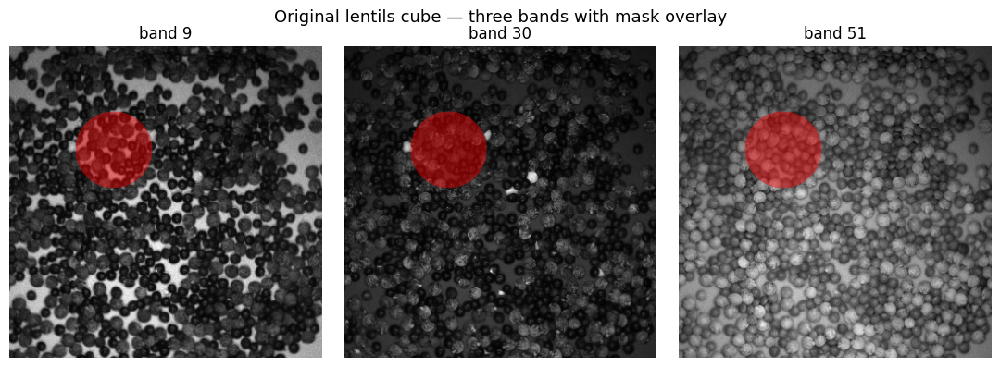

In [5]:
fig, axes = plt.subplots(1, 3, figsize=(11, 4))
for col, band in enumerate(BANDS):
    rgb = overlay_mask(to_uint8_band(cube[0], band), mask[0])
    axes[col].imshow(rgb)
    axes[col].set_title(f"band {band}")
    axes[col].axis("off")
fig.suptitle("Original lentils cube — three bands with mask overlay", fontsize=13)
plt.tight_layout()
plt.show()

## 4 · `RandomHorizontalFlip`

Mirror the **width axis** (dim 2 on `(B, H, W, C)`). Each band's image flips left↔right; the mask gets the same flip applied. Useful when the sensor / scene has no horizontal handedness — e.g. lentils on a conveyor where left vs right is just placement.

With `prob=1.0` we force the flip on every call so the effect is unambiguous in the panel.

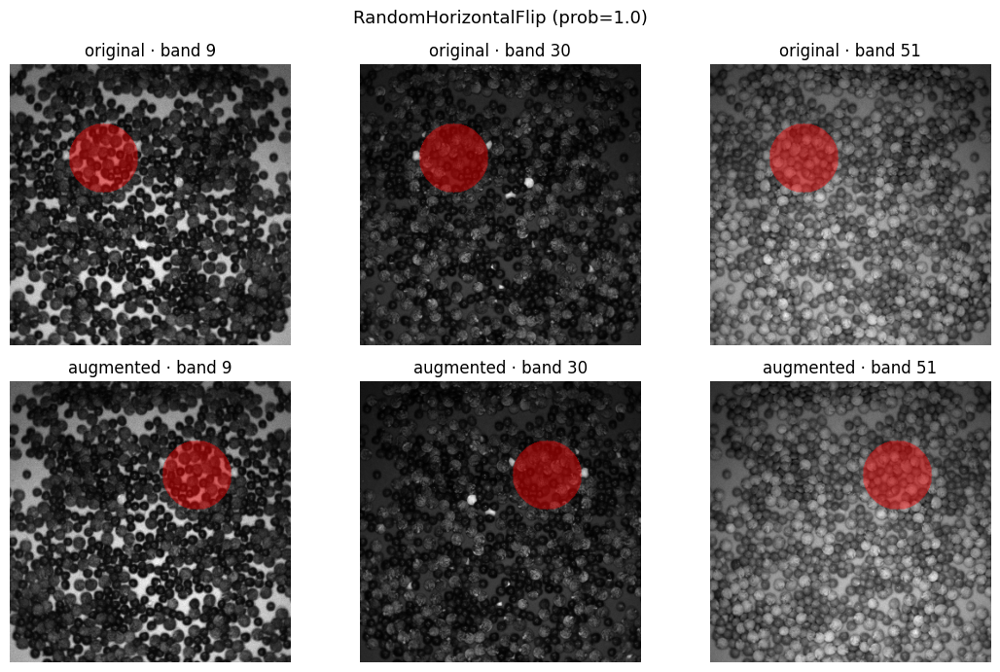

In [6]:
_ = run_single_transform(
    {"type": "RandomHorizontalFlip", "prob": 1.0},
    title="RandomHorizontalFlip (prob=1.0)",
    seed=0,
)

## 5 · `RandomVerticalFlip`

Mirror the **height axis** (dim 1 on `(B, H, W, C)`). The disc moves from the upper area to the lower area, identically across all three bands.

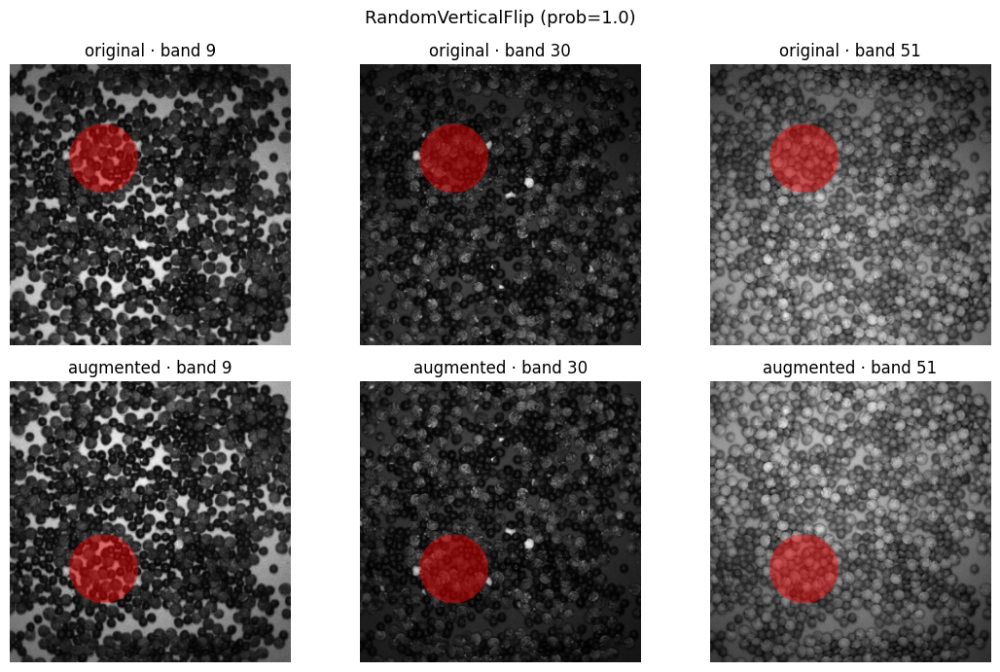

In [7]:
_ = run_single_transform(
    {"type": "RandomVerticalFlip", "prob": 1.0},
    title="RandomVerticalFlip (prob=1.0)",
    seed=0,
)

## 6 · `Random90Rotate`

Rotate by a random multiple of 90° (k ∈ {1, 2, 3}) per sample. Three seeds below — at least two should land on a different `k`, so the panels won't all look the same.

**Constraint:** when `k` is odd, the spatial dims swap (H↔W), which would break batching. So this transform requires **square spatial dims** when any sample draws odd `k`. Our centred-square crop in §2 ensures that.

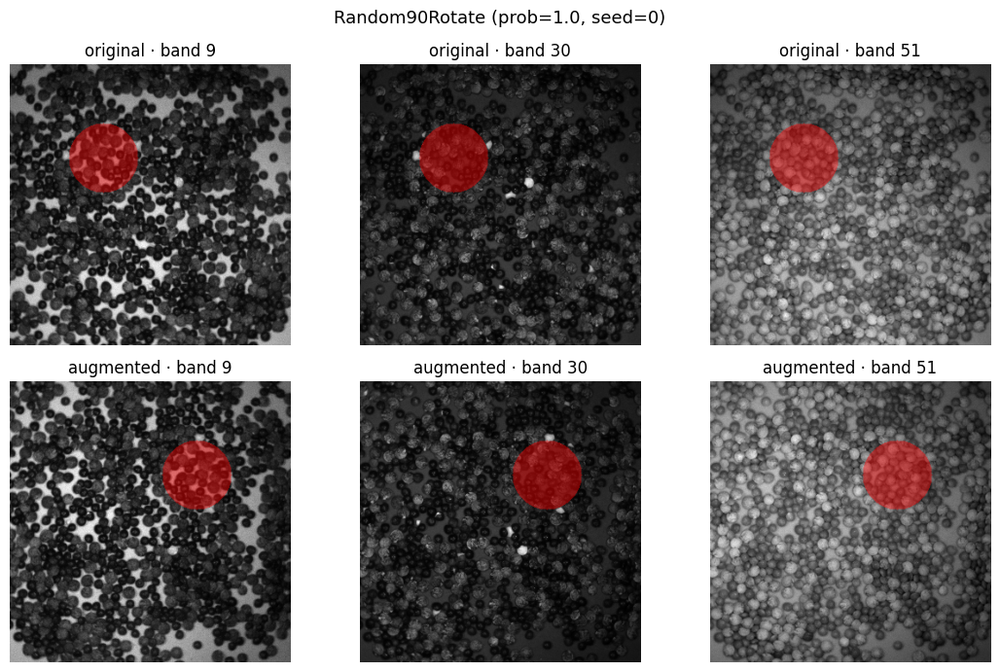

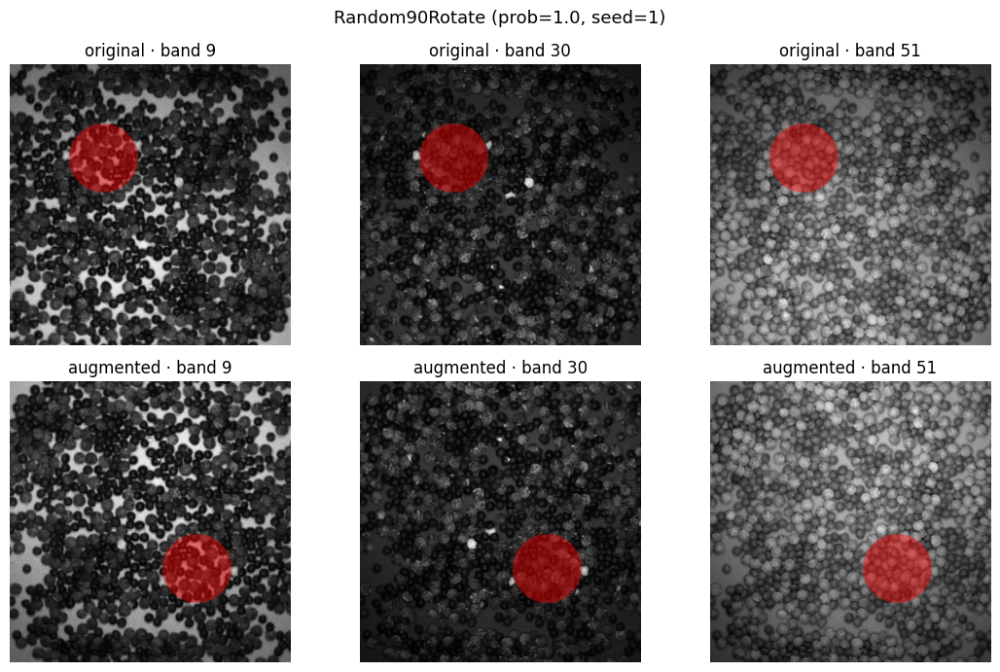

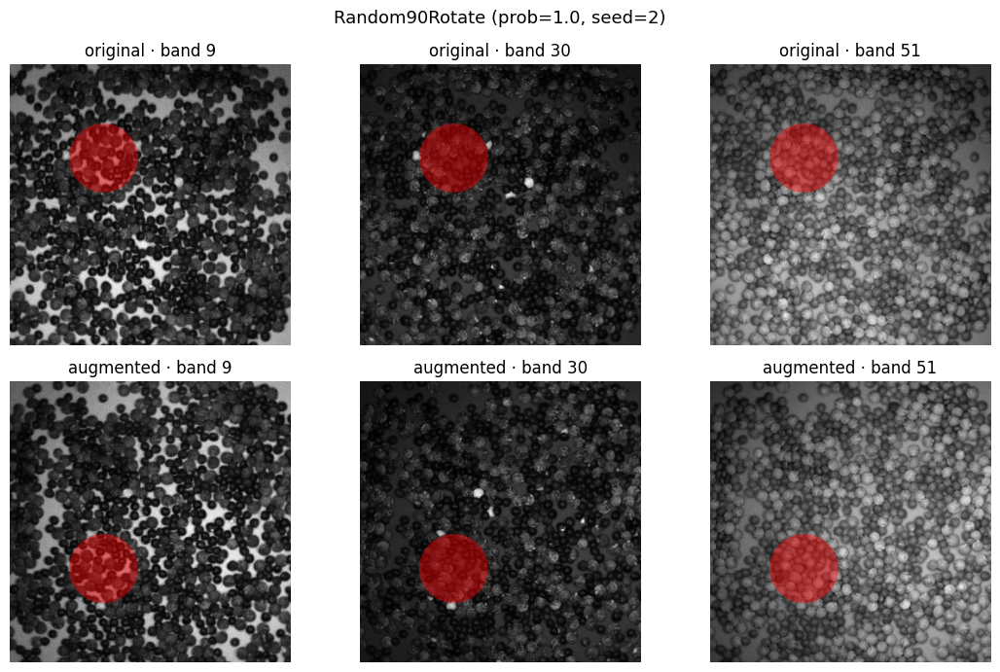

In [8]:
for seed in [0, 1, 2]:
    _ = run_single_transform(
        {"type": "Random90Rotate", "prob": 1.0},
        title=f"Random90Rotate (prob=1.0, seed={seed})",
        seed=seed,
    )

## 7 · `RandomSpatialCrop`

Crop to a fixed `(H_out, W_out)` output size at a per-sample random offset. With `prob<1.0` the un-randomised samples get a deterministic **centre crop** instead of being skipped (the output size has to stay uniform across the batch).

Useful when training resolution is lower than capture resolution — random crops act like a cheap form of synthetic translation.

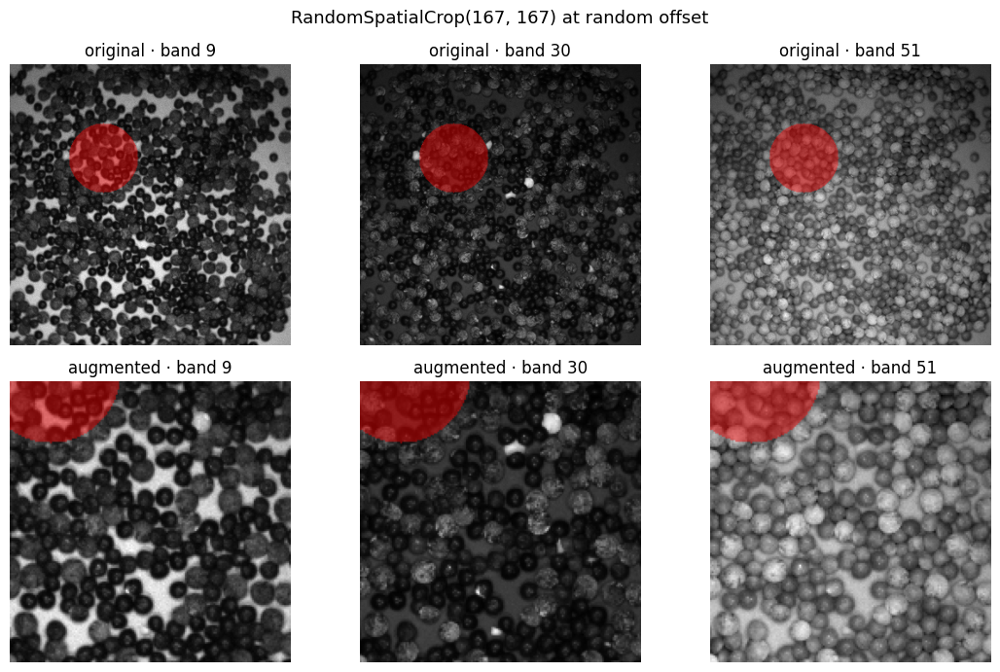

In [9]:
out_side = min(cube.shape[1], cube.shape[2]) // 2
_ = run_single_transform(
    {"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0},
    title=f"RandomSpatialCrop({out_side}, {out_side}) at random offset",
    seed=0,
)

## 8 · `GaussianBandNoise` (spectral)

Add per-band Gaussian noise — encourages downstream models to tolerate
sensor noise without latching onto a noise-free training distribution.
When `per_band_scale=True`, noise magnitude follows each band's own std.
Mask is **passthrough** by construction (spectral transforms don't move
pixels).

> Reference: Nalepa et al. 2019; Ahmad et al. 2024 §4.2.


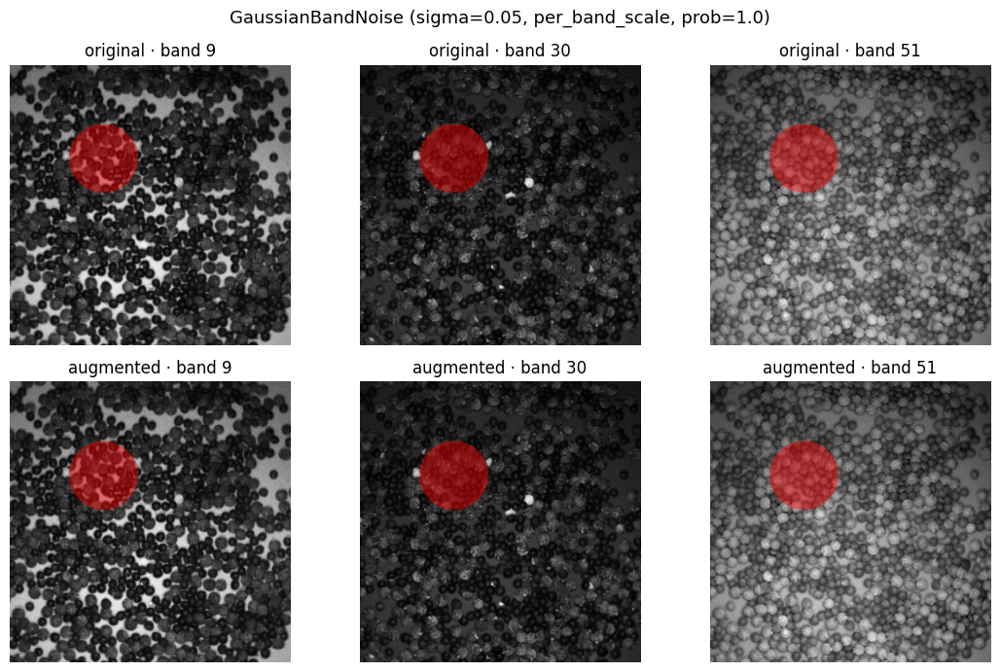

In [10]:
_ = run_single_transform(
    {"type": "GaussianBandNoise", "sigma": 0.05, "per_band_scale": True, "prob": 1.0},
    title="GaussianBandNoise (sigma=0.05, per_band_scale, prob=1.0)",
)

## 9 · `RandomBandDropout` (spectral)

Zero out a random subset of bands per sample. Functions as a spectral
dropout regulariser. With `drop_fraction=0.1` on a 61-band lentils cube,
≈ 6 bands go to zero each call — visible as dark stripes in the per-band
panels below if your sampled band hits one of the dropped indices.

> Reference: Ahmad et al. 2024 §4.3.


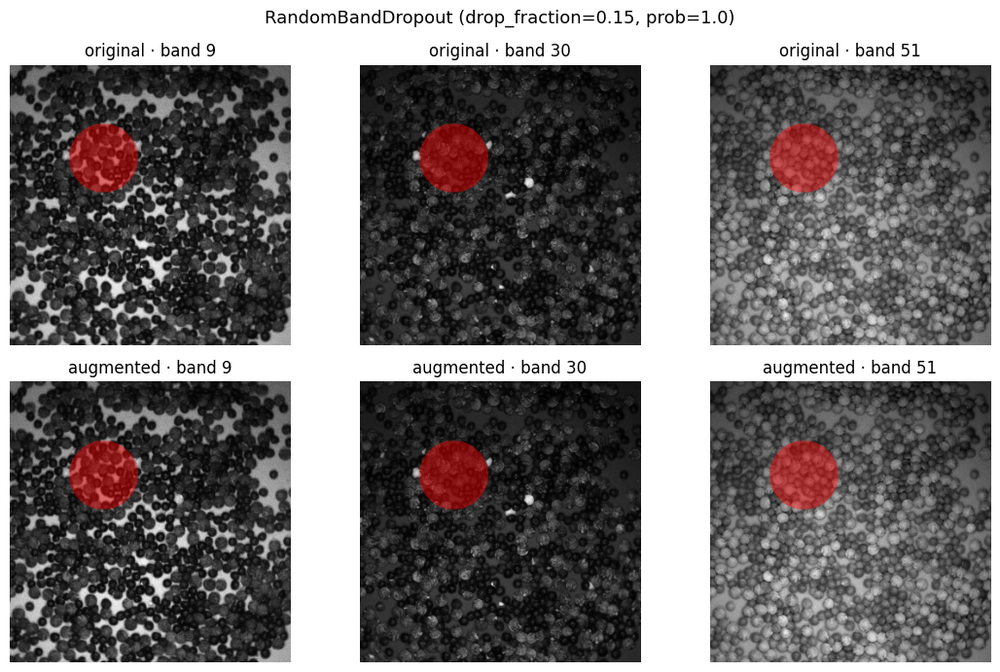

In [11]:
_ = run_single_transform(
    {"type": "RandomBandDropout", "drop_fraction": 0.15, "prob": 1.0},
    title="RandomBandDropout (drop_fraction=0.15, prob=1.0)",
)

## 10 · `MultiplicativeIlluminationScaling` (photometric)

Multiply each band by a **smooth random gain curve** across the spectrum.
Models lamp drift / illumination variation without breaking spectral
ratios between nearby bands (the way naive per-band brightness jitter would).

Lower `smoothness` → smoother gain curves (closer to a uniform scale);
higher `smoothness` → faster variation across the spectrum.

> Reference: Roddan et al. 2024 (Calibration-Jitter) — simplified to not
> require a white-reference cube. Nalepa 2019 §III-A.


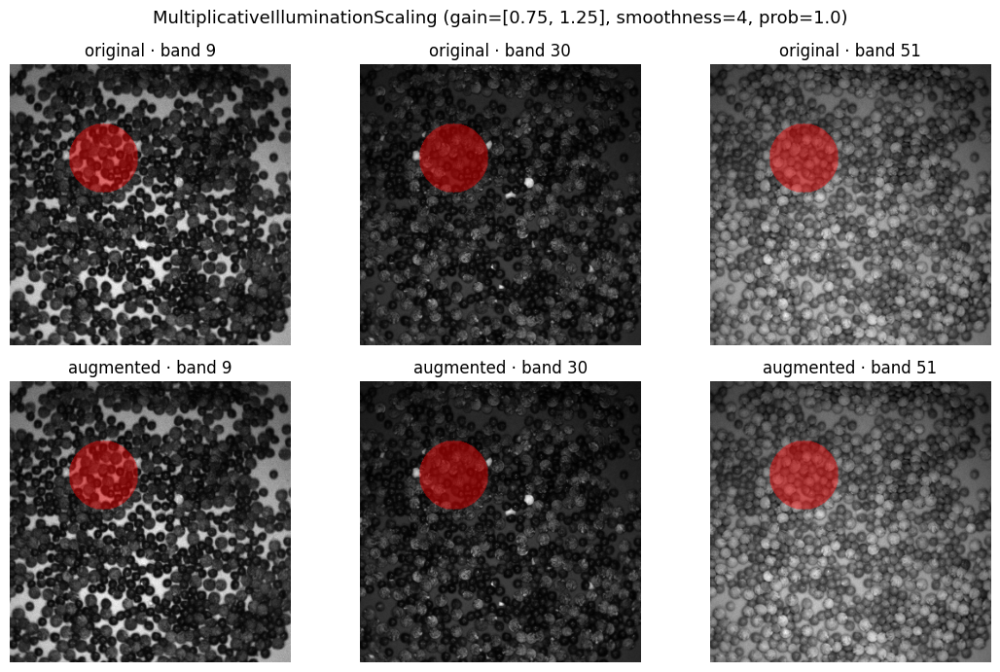

In [12]:
_ = run_single_transform(
    {
        "type": "MultiplicativeIlluminationScaling",
        "gain_range": [0.75, 1.25],
        "smoothness": 4,
        "prob": 1.0,
    },
    title="MultiplicativeIlluminationScaling (gain=[0.75, 1.25], smoothness=4, prob=1.0)",
)

## 11 · `Cutout` (mixing)

Erase a rectangular spatial patch in both cube and mask. The cube patch
is zeroed; the mask patch is set to `mask_fill_value` (default `0` — use
your downstream loss's ignore label here). Acts as a spatial regulariser:
the model can't rely on any one image region being present.

> Reference: DeVries & Taylor 2017 (Cutout); Haut et al. 2019 (HSI adaptation).


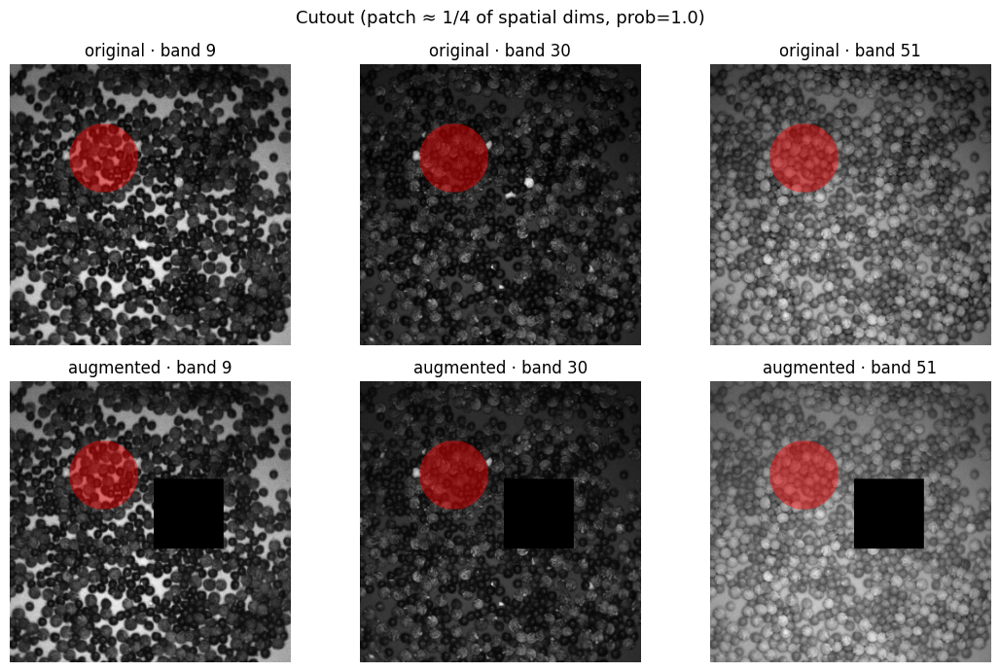

In [13]:
patch_h = min(cube.shape[1], cube.shape[2]) // 4
_ = run_single_transform(
    {"type": "Cutout", "patch_size": [patch_h, patch_h], "prob": 1.0},
    title="Cutout (patch ≈ 1/4 of spatial dims, prob=1.0)",
)

## 12 · Full `AugmentationCompose`

Seven transforms across four families (spatial / spectral / photometric / mixing) chained, five seeds. The `prob` values are deliberately under 1.0 so that not every transform fires on every call — that's how real training pipelines run.

Notice how the five panels differ from each other: stochasticity is real, the seed reproduces the exact same sequence.

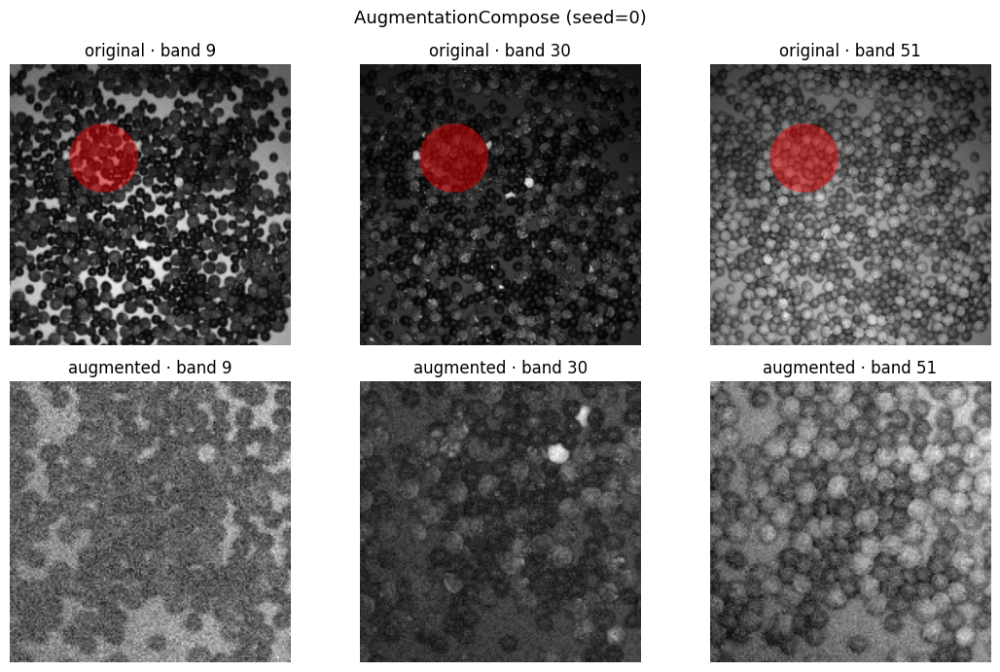

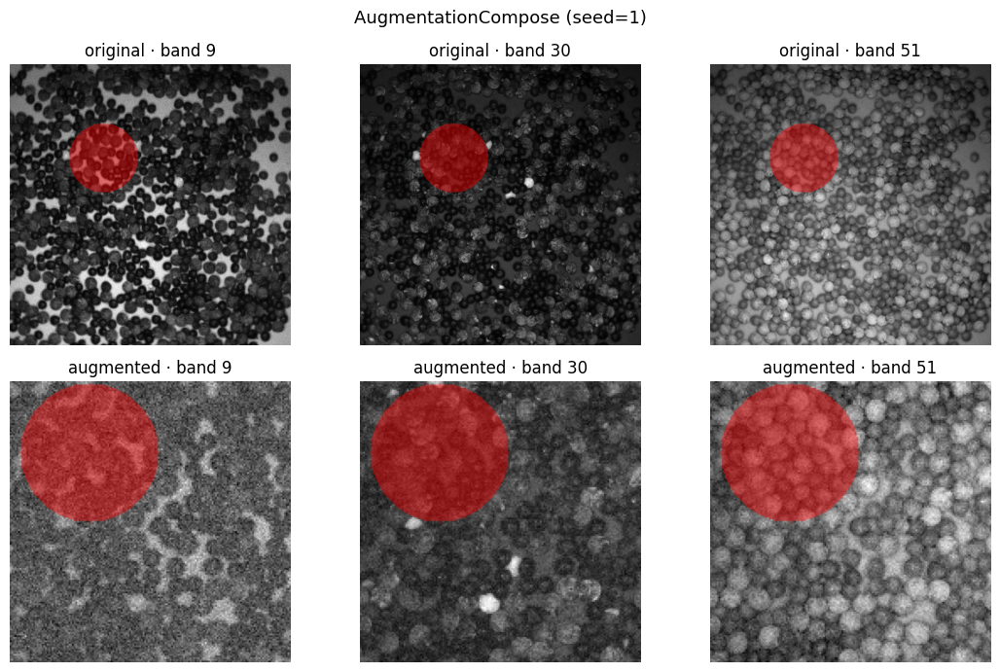

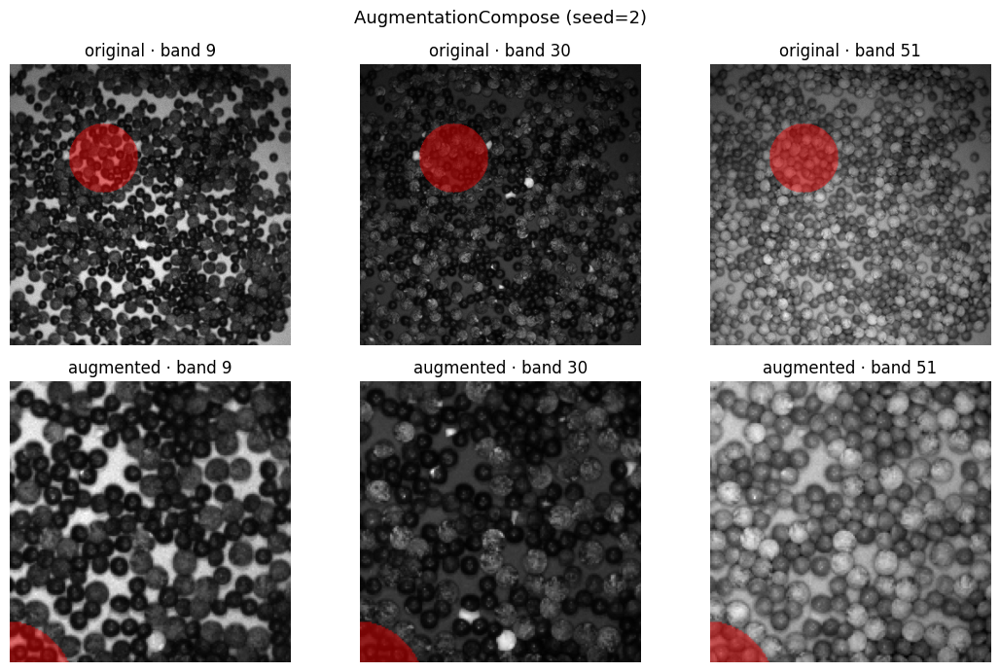

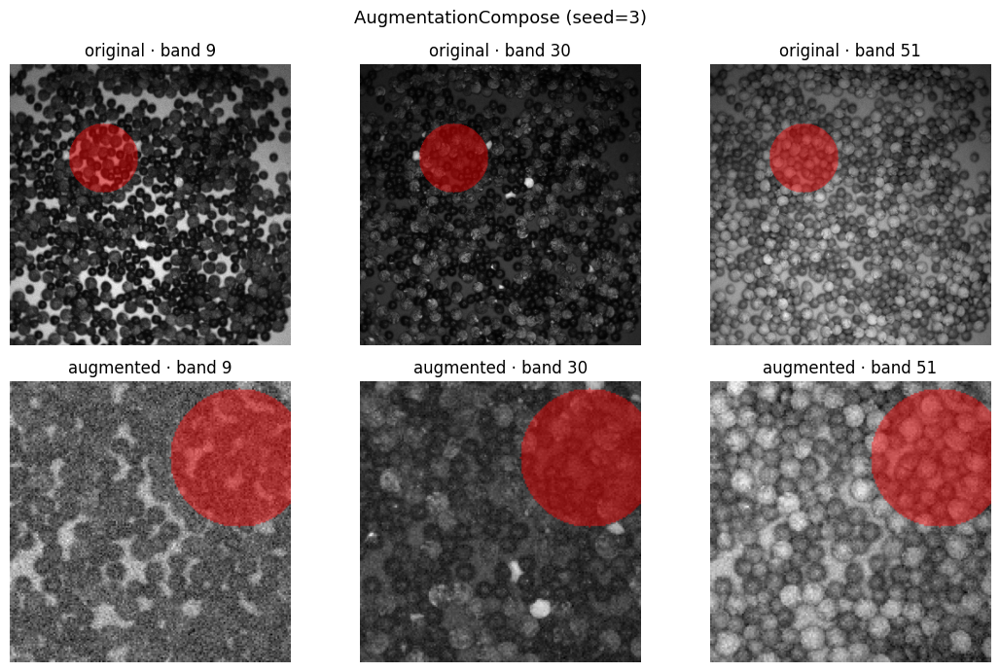

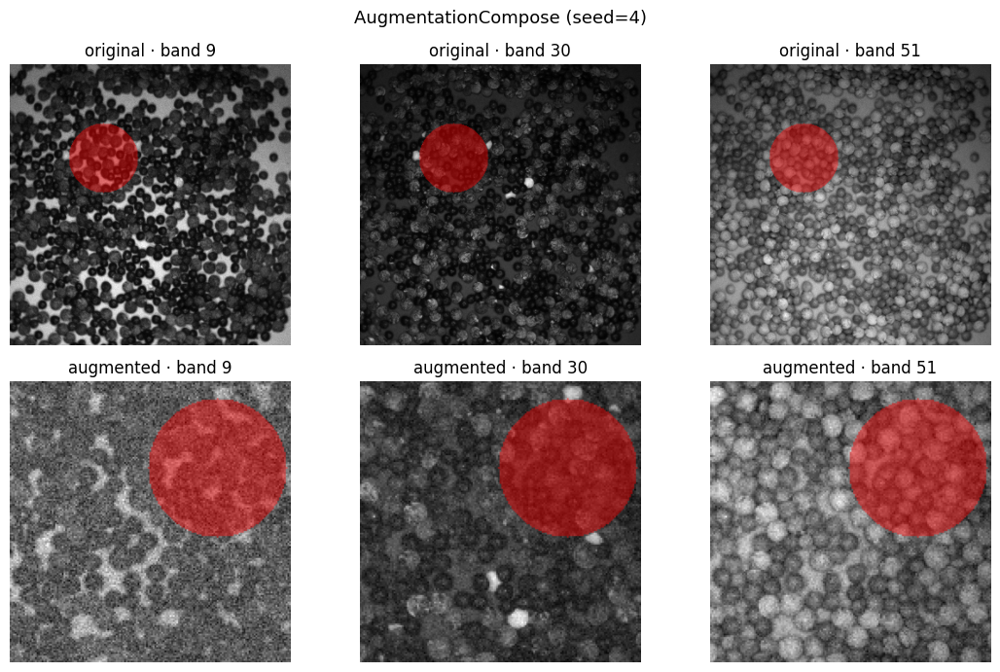

In [14]:
specs = [
    {"type": "RandomHorizontalFlip", "prob": 0.5},
    {"type": "RandomVerticalFlip", "prob": 0.5},
    {"type": "Random90Rotate", "prob": 0.5},
    {"type": "GaussianBandNoise", "sigma": 0.03, "prob": 0.5},
    {"type": "MultiplicativeIlluminationScaling", "prob": 0.5},
    {"type": "Cutout", "patch_size": [16, 16], "prob": 0.5},
    {"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0},
]
for seed in [0, 1, 2, 3, 4]:
    node = AugmentationCompose(transforms=specs, seed=seed)
    out = node.forward(cube=cube, mask=mask)
    show_before_after_3bands(
        cube, mask, out["cube"], out.get("mask"), title=f"AugmentationCompose (seed={seed})"
    )

## 13 · Programmatic sanity checks

The visualisation panels above are for humans. These cells are for the notebook itself — if a regression breaks any of these properties, the notebook fails loudly when `nbconvert --execute`'s the file in CI / pre-release.

Properties checked:

- **Idempotency under double-flip** — `HFlip ∘ HFlip == identity`, same for `VFlip`. Holds for `prob=1.0`.
- **Band-mean invariance under flip** — flipping doesn't add or remove energy, so the per-band mean must be unchanged.
- **Mask-cube co-location** — for `RandomHorizontalFlip(prob=1.0)`, a marker pixel must land at the mirrored coordinate in *both* the cube and the mask.
- **Crop output shape** — `RandomSpatialCrop(size=(s, s))` produces a `(B, s, s, C)` cube.

In [15]:
# 9a. HFlip ∘ HFlip == identity.
hflip = AugmentationCompose(transforms=[{"type": "RandomHorizontalFlip", "prob": 1.0}], seed=0)
once = hflip.forward(cube=cube, mask=mask)
twice = hflip.forward(cube=once["cube"], mask=once["mask"])
assert torch.equal(twice["cube"], cube), "HFlip ∘ HFlip should equal identity on the cube."
assert torch.equal(twice["mask"], mask), "HFlip ∘ HFlip should equal identity on the mask."

# 9b. VFlip is similarly involutive.
vflip = AugmentationCompose(transforms=[{"type": "RandomVerticalFlip", "prob": 1.0}], seed=0)
v_once = vflip.forward(cube=cube, mask=mask)
v_twice = vflip.forward(cube=v_once["cube"], mask=v_once["mask"])
assert torch.equal(v_twice["cube"], cube)

# 9c. Per-band mean is invariant under any flip (no energy change).
mean_before = cube.mean(dim=(1, 2))  # (B, C)
mean_after = once["cube"].mean(dim=(1, 2))
assert torch.allclose(mean_before, mean_after, atol=1e-5), "Per-band mean drifted under HFlip."

# 9d. Marker pixel co-location through HFlip(prob=1.0).
probe_cube = cube.clone()
probe_mask = mask.clone()
probe_cube[0, 7, 11, :] = 999.0
probe_mask[0, 7, 11] = 42
p_out = hflip.forward(cube=probe_cube, mask=probe_mask)
W = probe_cube.shape[2]
expected_w = W - 1 - 11
assert p_out["cube"][0, 7, expected_w, 0].item() == 999.0
assert int(p_out["mask"][0, 7, expected_w].item()) == 42

# 9e. Crop output shape.
crop = AugmentationCompose(
    transforms=[{"type": "RandomSpatialCrop", "size": [out_side, out_side], "prob": 1.0}],
    seed=0,
)
c_out = crop.forward(cube=cube, mask=mask)
assert tuple(c_out["cube"].shape) == (cube.shape[0], out_side, out_side, cube.shape[3])
assert tuple(c_out["mask"].shape) == (cube.shape[0], out_side, out_side)

print("All sanity checks passed.")

All sanity checks passed.


## 14 · Takeaways

- **`execution_stages={TRAIN}`** means `AugmentationCompose` is a no-op outside training. You don't need to remove it from your pipeline YAML for evaluation runs.
- **Seed once at the Node, not per-transform** — `seed:` on `AugmentationCompose` controls the shared `torch.Generator` that every Transform draws from. Reproducible training runs need *only* this seed plus the pipeline's data-loader seed.
- **Three-band sanity is cheap** — every time you add a new transform, re-render the panel above. If band 0 and band 30 don't agree on what the augmentation did, the implementation has an axis bug.
- **`Random90Rotate` wants square cubes** when any sample's k is odd. Centre-crop or pad before this transform if your sensor output isn't square.
- **Mask handling is paired** — flips and rotations share the same per-sample decision tensor with the cube. Crops share the same offset. If you write a new transform that breaks pairing, the marker-pixel assertion in §9d will catch it.

**v0.2.0 roadmap:** continuous-angle affine, photometric jitter (per-band gain / offset), spectral mixup, MixUp-style cube blending.